# FinTabNet Dataset

FinTabNet is a large dataset of document images from financial earnings of Fortune500 companies.

The dataset is open sourced by IBM Research and is [available to download freely](https://developer.ibm.com/exchanges/data/all/fintabnet/) on the IBM Developer [Data Asset Exchange](http://ibm.biz/data-exchange). 

This notebook can be found on [Watson Studio](https://dataplatform.cloud.ibm.com/analytics/notebooks/v2/f57cf3f6-e972-48ff-ab7b-3771ba7b9683/view?access_token=317644327d84f5d75b4782f97499146c78d029651a7c7ace050f4a7656033c30).

## Download and Extract the Dataset

In this section, we will download and extract the dataset. We will also install dependencies as needed. 

#### Installing PDF-to-image utils
For this notebook we will install 2 PyPi packages `pdf2image` and `pypdf2` as shown in the cell below. 
Additionally for all cells to work, we will also need a system wide package called `poppler`. This needs to be installed for the Watson Studio environment. Please follow the instructions [here](https://dataplatform.cloud.ibm.com/docs/content/wsj/analyze-data/customize-envs.html) to install a custom `conda` package. Specifically we need to install the `conda` package `poppler`.

In [1]:

# importing prerequisites
import sys
import requests
import tarfile
import json
import numpy as np
import pdf2image
from os import path
from PIL import Image
from PIL import ImageFont, ImageDraw
from glob import glob
from matplotlib import pyplot as plt
from pdf2image import convert_from_path
from PyPDF2 import PdfReader
from IPython.core.display import display, HTML
import pdb
import copy

%matplotlib inline


/tmp/ipykernel_4390/688330612.py:15: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython.display
  from IPython.core.display import display, HTML


## Visualizing the Data

In this section, we visualize the annotations file by overlaying it on the underlying image.
We also display the HTML structure for each table to compare.

In [2]:
# Define color code
categories = ["table", "cell"]
colors = [(0, 0, 255), (0, 255, 0)]  # Red = table, Green = cell in BGR for cv2




# Function to viz the annotation
def markup(image, annotations, pdf_height):
    ''' Draws the segmentation, bounding box, and label of each annotation
    '''
    draw = ImageDraw.Draw(image, 'RGBA')
    for annotation in annotations:
        # Draw bbox
        orig_annotation = copy.copy(annotation['bbox'])
        annotation['bbox'][1] = float(pdf_height)-float(orig_annotation[3])
        annotation['bbox'][3] = float(pdf_height)-float(orig_annotation[1])
        draw.rectangle(
            (annotation['bbox'][0],
             annotation['bbox'][1],
             annotation['bbox'][2],
             annotation['bbox'][3]),
            outline=colors[annotation['category_id']] + (255,),
            width=2
        )
        # Draw label
        bbox = draw.textbbox((0, 0), categories[annotation['category_id'] ])
        w, h = bbox[2] - bbox[0], bbox[3] - bbox[1]

        if annotation['bbox'][3] < h:
            draw.rectangle(
                (annotation['bbox'][2],
                 annotation['bbox'][1],
                 annotation['bbox'][2] + w,
                 annotation['bbox'][1] + h),
                fill=(64, 64, 64, 255)
            )
            draw.text(
                (annotation['bbox'][2],
                 annotation['bbox'][1]),
                text=categories[annotation['category_id']],
                fill=(255, 255, 255, 255)
            )
        else:
            draw.rectangle(
                (annotation['bbox'][0]-w,
                 annotation['bbox'][1]-h,
                 annotation['bbox'][0],
                 annotation['bbox'][1]),
                fill=(64, 64, 64, 255)
            )
            draw.text(
                (annotation['bbox'][0]-w,
                 annotation['bbox'][1]-h),
                text=categories[annotation['category_id']],
                fill=(255, 255, 255, 255)
            )
    return np.array(image)

In [4]:
import json

def parse_fintabnet_jsonl(jsonl_path, pdf_folder):
    images_data = {}

    with open(jsonl_path, 'r') as fp:
        for line in fp:
            sample = json.loads(line)
            filename = sample['filename']

            if filename in images_data:
                annotations = images_data[filename]["annotations"]
                html = images_data[filename]["html"]
            else:
                annotations = []
                html = ""

            # Parse cell bounding boxes
            for token in sample["html"]["cells"]:
                if "bbox" in token:
                    annotations.append({
                        "category_id": 1,  # cell
                        "bbox": token["bbox"]
                    })

            # Reconstruct HTML table
            cnt = 0
            for token in sample["html"]["structure"]["tokens"]:
                html += token
                if token == "<td>":
                    html += "".join(sample["html"]["cells"][cnt]["tokens"])
                    cnt += 1

            # Table bbox
            annotations.append({
                "category_id": 0,  # table
                "bbox": sample["bbox"]
            })

            images_data[filename] = {
                'filepath': f"{pdf_folder}/{filename}",
                'html': html,
                'annotations': annotations
            }

    return images_data


train_jsonl = 'fintabnet/FinTabNet_1.0.0_table_train.jsonl'
val_jsonl = 'fintabnet/FinTabNet_1.0.0_table_val.jsonl'
test_jsonl = 'fintabnet/FinTabNet_1.0.0_table_test.jsonl'
pdf_folder = 'fintabnet/pdf'

#print("Train")
#images_train = parse_fintabnet_jsonl(train_jsonl, pdf_folder)
# print("Val")
# images_val = parse_fintabnet_jsonl(val_jsonl, pdf_folder)
print("Test")
images_test = parse_fintabnet_jsonl(test_jsonl, pdf_folder)





Test


In [5]:
images_test

{'HAL/2009/page_77.pdf': {'filepath': 'fintabnet/pdf/HAL/2009/page_77.pdf',
  'html': '<table><tr><td></td><td colspan="3"></td></tr><tr><td>December 31</td><td>Millions of dollars</td><td>2009</td><td>2008</td></tr><tr><td>2007</td><td>Total assets:</td><td></td><td></td></tr><tr><td></td><td>Completion and Production</td><td>$5,920</td><td>$5,936</td></tr><tr><td>$4,763</td><td>Drilling and Evaluation</td><td>6,204</td><td>6,205</td></tr><tr><td>4,685</td><td>Shared assets</td><td>914</td><td>648</td></tr><tr><td>672</td><td>Corporate and other</td><td>3,500</td><td>1,596</td></tr><tr><td>3,015</td><td>Total</td><td>$16,538</td><td>$14,385</td></tr></table><table><tr><td></td><td colspan="3"></td></tr><tr><td>Year Ended December 31</td><td>Millions of dollars</td><td>2009</td><td>2008</td></tr><tr><td>2007</td><td>Revenue:</td><td></td><td></td></tr><tr><td></td><td>United States</td><td>$5,248</td><td>$7,775</td></tr><tr><td>$6,673</td><td>Other countries</td><td>9,427</td><td>10,50

In [4]:
from detectron2.structures import BoxMode
from PIL import Image
import os 
from detectron2.structures import BoxMode
from PIL import Image

def convert_to_detectron(images_dict):
    dataset_dicts = []

    for idx, (filename, data) in enumerate(images_dict.items()):
        print(f"Processing: {idx}/{len(images_dict)}", end="\r")
        record = {}
        png_path = data["filepath"].replace(".pdf", ".png")

        # Get image size from PNG (faster)
        with Image.open(png_path) as img:
            width, height = img.size

        record["file_name"] = png_path
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        adjusted_annotations = []

        # Correct annotation flipping here
        for ann in data["annotations"]:
            x1, y1, x2, y2 = ann["bbox"]

            # Flip vertically
            new_y1 = height - y2
            new_y2 = height - y1

            # Ensuring coordinates are sorted correctly
            y_top, y_bottom = sorted([new_y1, new_y2])

            adjusted_annotations.append({
                "bbox": [x1, y_top, x2, y_bottom],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": ann["category_id"]
            })

        record["annotations"] = adjusted_annotations
        dataset_dicts.append(record)

    return dataset_dicts



# Use this to register with Detectron2
print("Images train: ", len(images_train))
train_dataset = convert_to_detectron(images_train)
print("Images val: ", len(images_val))
val_dataset = convert_to_detectron(images_val)
print("Images test: ", len(images_test))
test_dataset = convert_to_detectron(images_test)


# --- Registration with Detectron2 ---
# from detectron2.data import DatasetCatalog, MetadataCatalog
# DatasetCatalog.register("fintabnet_train", lambda: load_fintabnet_dicts("path/to/train.jsonl", "path/to/images"))
# MetadataCatalog.get("fintabnet_train").set(thing_classes=["category1", "category2",...]) # Define classes
# # Register val/test sets similarly

Images train:  48001
Images val:  5943/48001
Images test:  5903943


Visualize Dataset

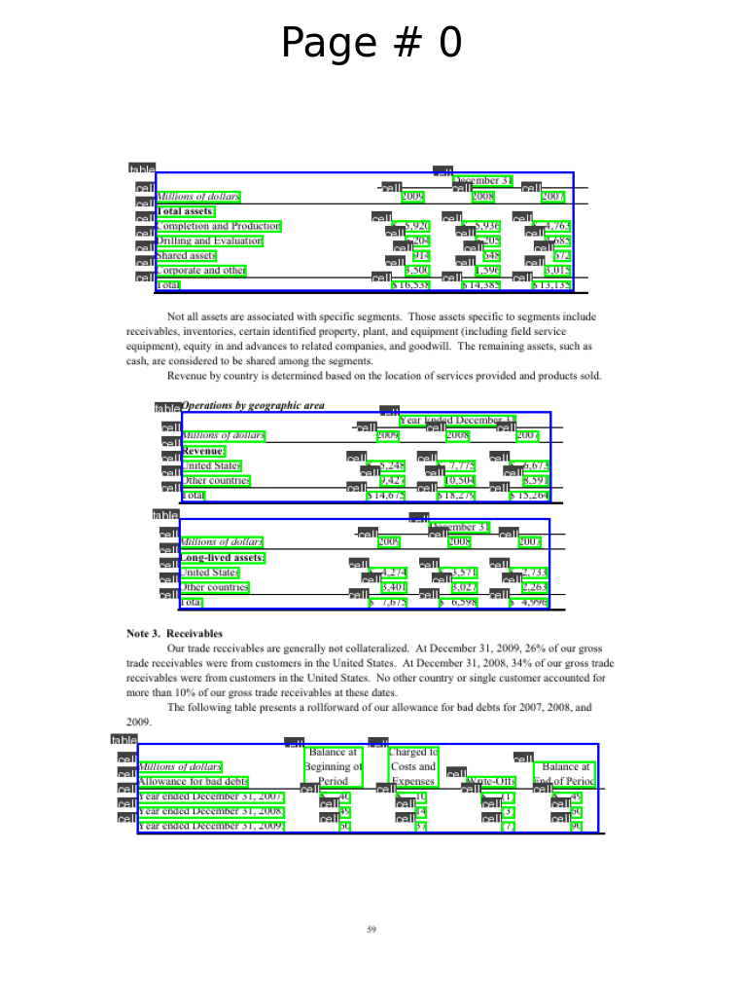

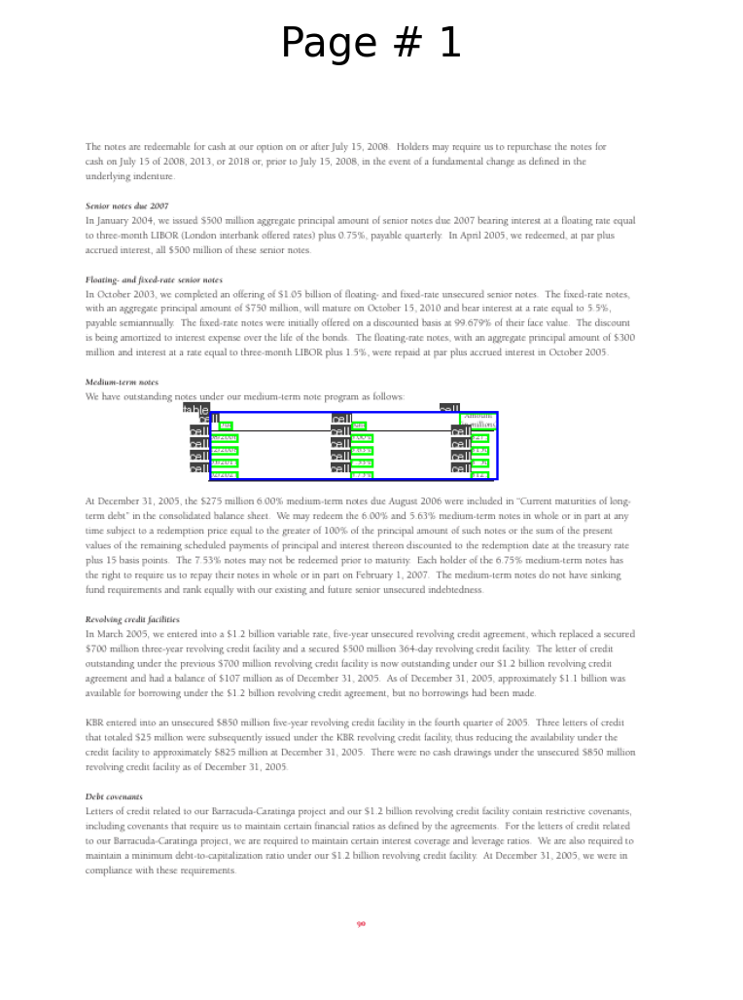

In [5]:
# Visualize annotations and print HTML tables

import matplotlib

matplotlib.rcParams['figure.dpi'] = 250
for i, (filename, image) in enumerate(images_test.items()):
    pdf_page = PdfReader(open(image["filepath"], 'rb')).pages[0]
    pdf_shape = pdf_page.mediabox
    pdf_height = pdf_shape[3]-pdf_shape[1]
    pdf_width = pdf_shape[2]-pdf_shape[0]
    converted_images = convert_from_path(image["filepath"], size=(pdf_width, pdf_height))
    img = converted_images[0]
    #print("Table HTML for page #{}".format(i))
    #display(HTML(image['html']))
    plt.figure()
    plt.imshow(markup(img, image['annotations'], pdf_height))
    plt.title("Page # {}".format(i))
    plt.axis('off')
    if i == 1:
        break


Register Dataset

In [6]:
from detectron2.data import DatasetCatalog, MetadataCatalog

def register_dataset(name, dataset):
    DatasetCatalog.register(name, lambda: dataset)
    MetadataCatalog.get(name).set(thing_classes=["table", "cell"])

register_dataset("fintabnet_train", train_dataset)
register_dataset("fintabnet_val", val_dataset)
register_dataset("fintabnet_test", test_dataset)

In [7]:
def table_cell_penalty(pred_boxes, table_boxes):
    # Pseudo-code: check if predicted cell bbox is inside any table bbox
    penalty = 0
    for cell_box in pred_boxes:
        if not any(is_inside(cell_box, table_box) for table_box in table_boxes):
            penalty += some_penalty_weight
    return penalty


Actual Model Training

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
import os

cfg = get_cfg()

# Load base config
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2

# Set datasets
cfg.DATASETS.TRAIN = ("fintabnet_train",)
cfg.DATASETS.TEST = ("fintabnet_val",)


# Set paths
cfg.OUTPUT_DIR = "./output_fintabnet"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Model weights (pretrained on COCO)
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")


# Training config
cfg.SOLVER.CHECKPOINT_PERIOD = 500
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000    # Adjust as needed
cfg.SOLVER.STEPS = []         # No LR decay
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# Output every 100 iters
cfg.TEST.EVAL_PERIOD = 1000

from detectron2.engine import DefaultTrainer

class FinTabNetTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        from detectron2.evaluation import COCOEvaluator
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, False, output_folder)



In [ ]:
trainer = FinTabNetTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[04/25 13:13:15 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/home/saint/anaconda3/envs/detectron2_env/lib/python3.10/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, ma

[04/25 13:13:18 d2.engine.hooks]: Loading scheduler from state_dict ...
[04/25 13:13:19 d2.engine.train_loop]: Starting training from iteration 1500


/home/saint/anaconda3/envs/detectron2_env/lib/python3.10/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1729647352509/work/aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Predictions

[04/25 02:04:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from output_fintabnet/model_0001499.pth ...


/home/saint/anaconda3/envs/detectron2_env/lib/python3.10/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, ma

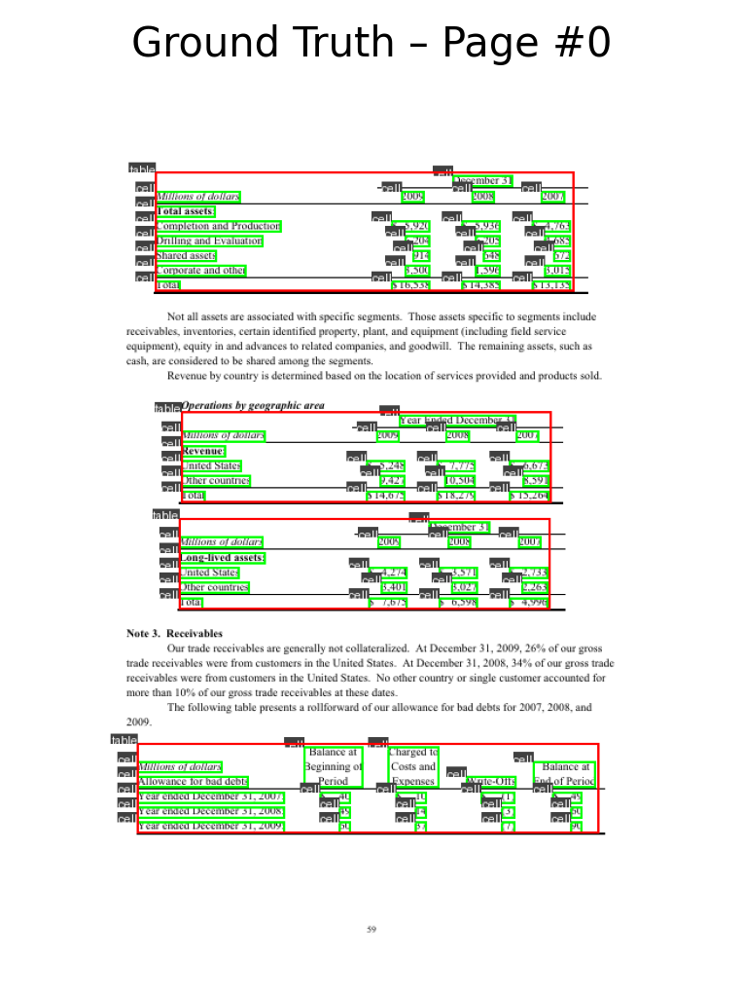

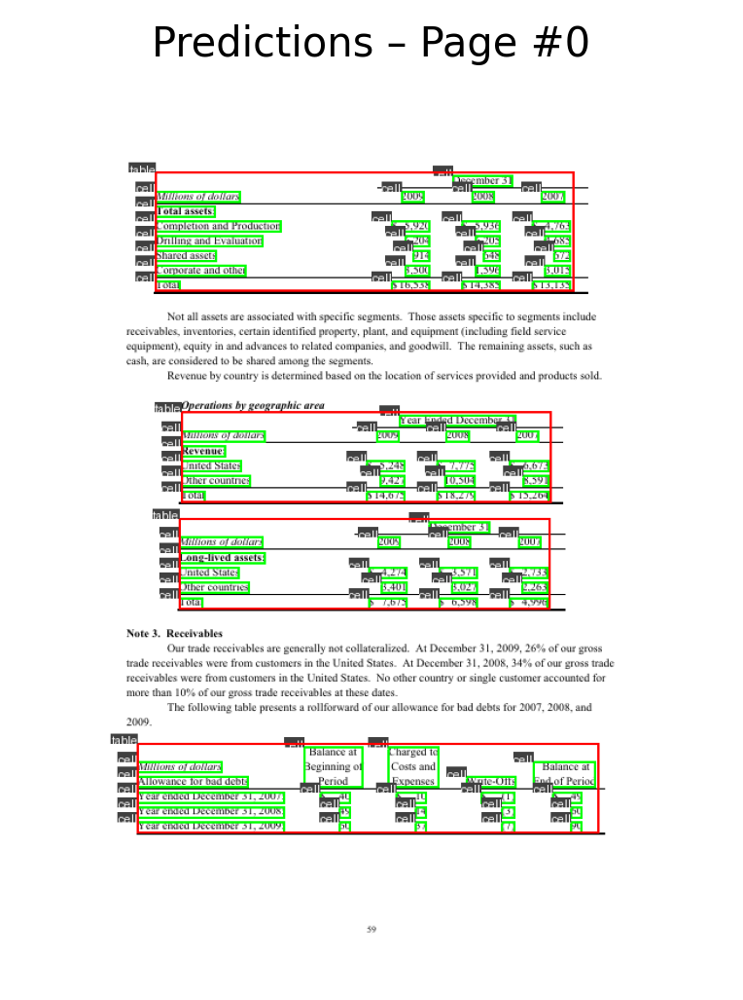

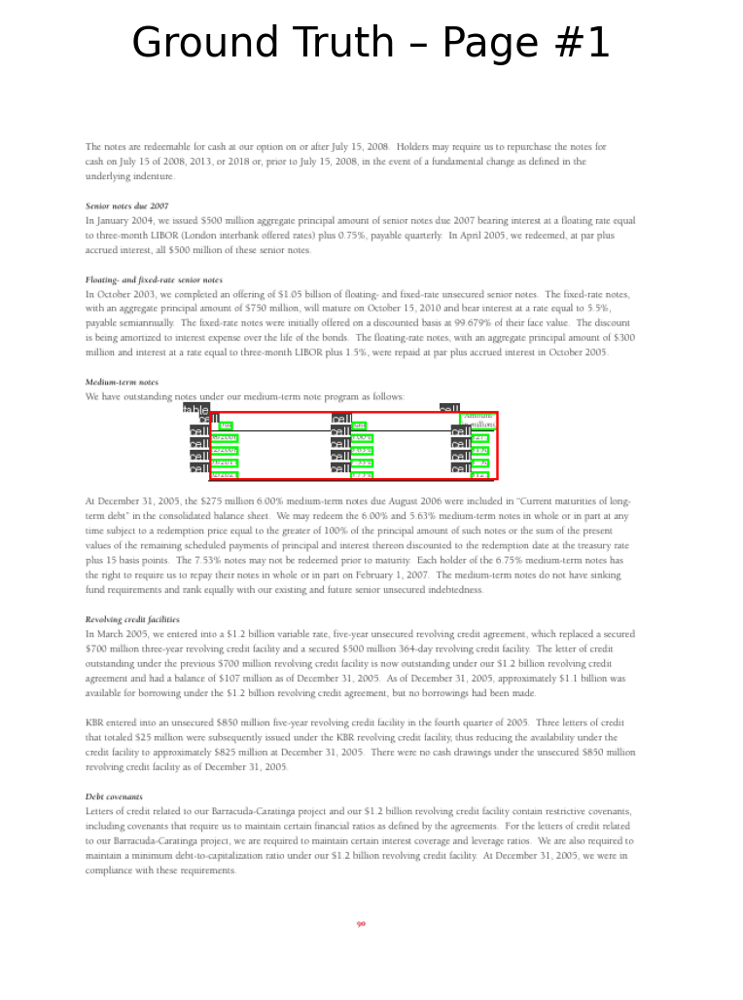

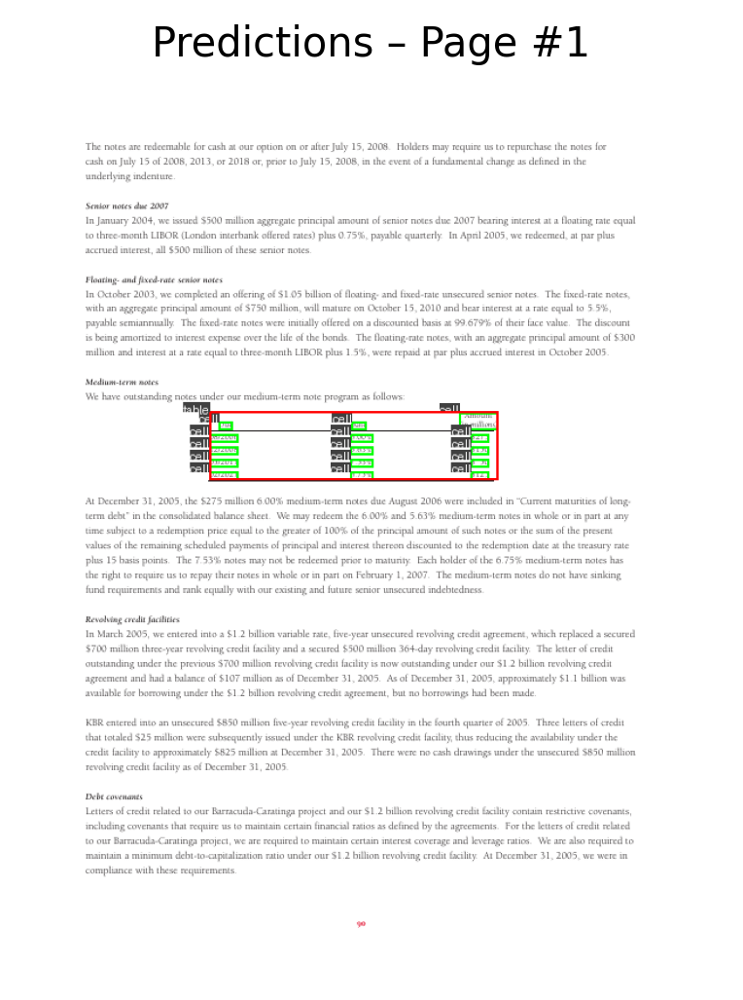

In [ ]:
import matplotlib.pyplot as plt
from PyPDF2 import PdfReader
from pdf2image import convert_from_path
import matplotlib
import numpy as np

matplotlib.rcParams['figure.dpi'] = 250

cfg.MODEL.WEIGHTS = os.path.join("output_fintabnet", "model_0001499.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
predictor = DefaultPredictor(cfg)

for i, (filename, image) in enumerate(images_test.items()):
    # Get correct PDF dimensions
    pdf_page = PdfReader(open(image["filepath"], 'rb')).pages[0]
    pdf_shape = pdf_page.mediabox
    pdf_height = float(pdf_shape[3]) - float(pdf_shape[1])
    pdf_width = float(pdf_shape[2]) - float(pdf_shape[0])

    # Convert PDF page to image
    converted_images = convert_from_path(image["filepath"], size=(int(pdf_width), int(pdf_height)))
    img = converted_images[0].convert("RGB")
    img_np = np.array(img)

    # Make predictions
    outputs = predictor(img_np[:, :, ::-1])
    instances = outputs["instances"].to("cpu")
    boxes = instances.pred_boxes.tensor.numpy().astype(int)
    classes = instances.pred_classes.numpy()

    # Format predictions for markup
    prediction_annotations = []
    for box, cat_id in zip(boxes, classes):
        x1, y1, x2, y2 = map(int, box)
        prediction_annotations.append({
            "bbox": [x1, y1, x2, y2],
            "category_id": int(cat_id)
        })

    # --- Ground Truth Plot ---
    plt.figure()
    plt.imshow(markup(img, image["annotations"], pdf_height))  # only GT
    plt.title("Ground Truth – Page #{}".format(i))
    plt.axis('off')

    # --- Predictions Plot ---
    plt.figure()
    plt.imshow(markup(img, prediction_annotations, pdf_height))  # only predictions
    plt.title("Predictions – Page #{}".format(i))
    plt.axis('off')

    plt.show()

    if i == 1:
        break


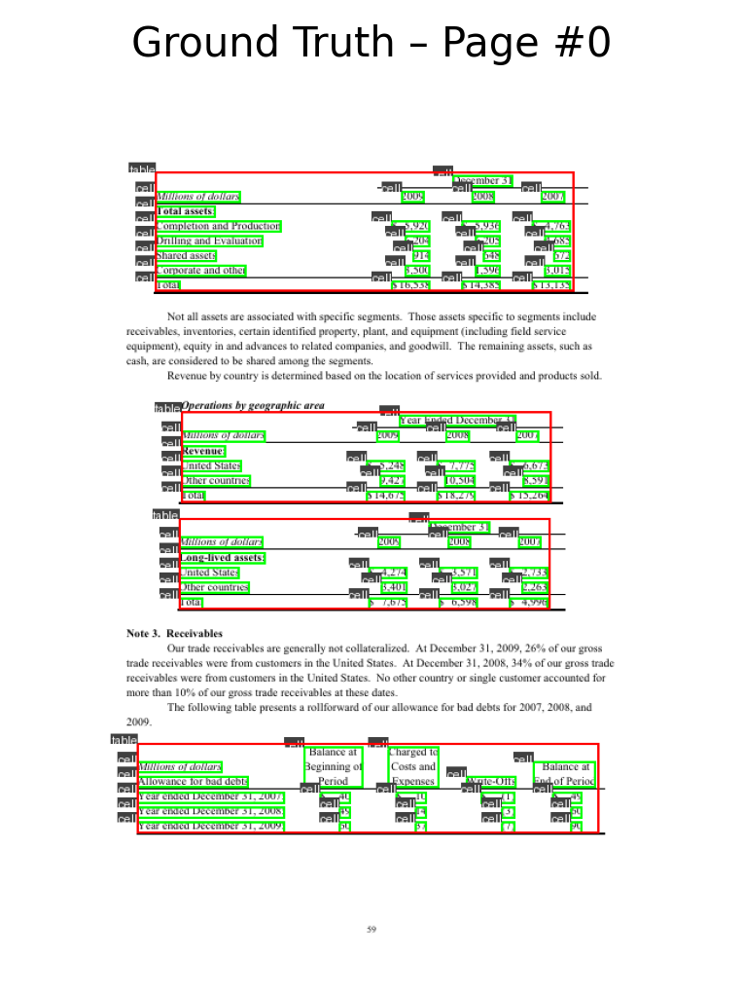

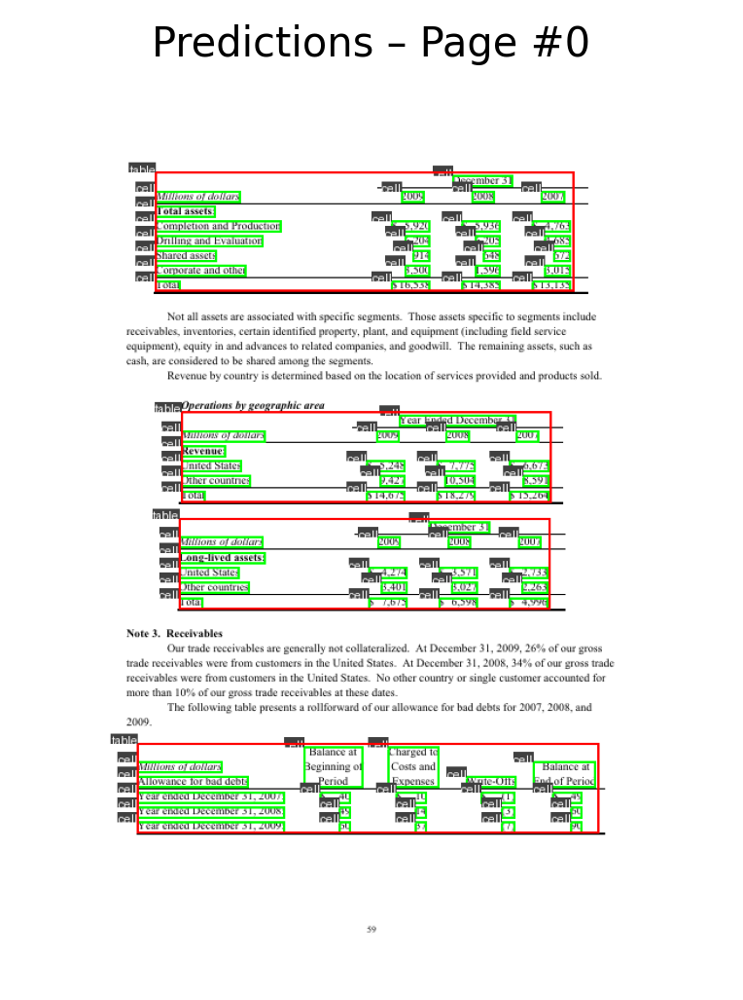

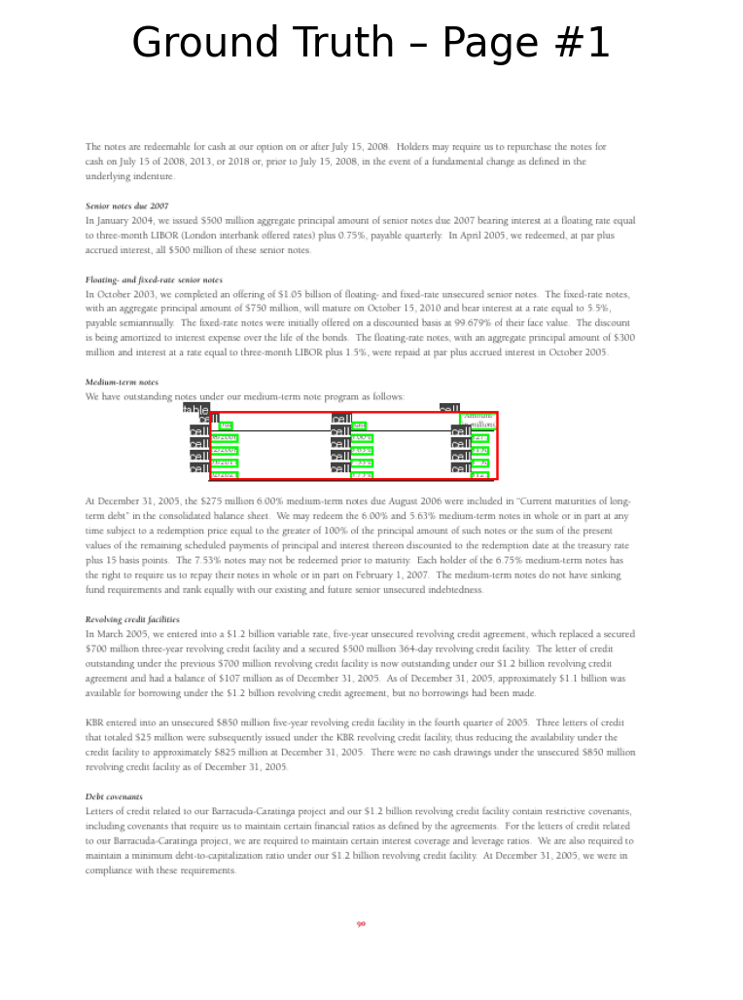

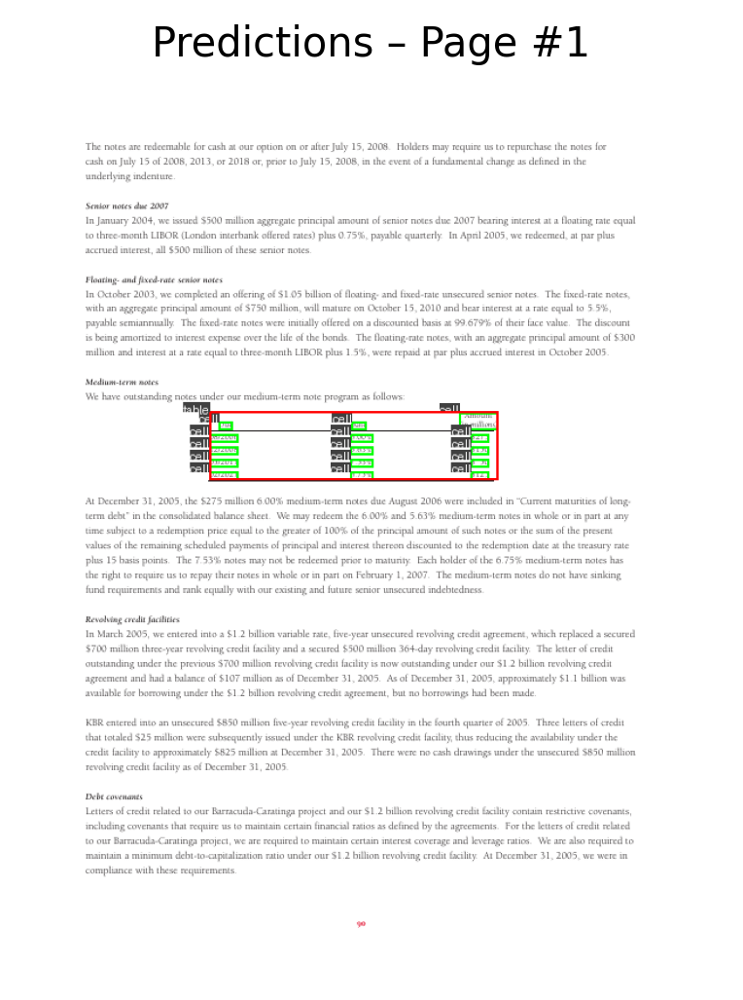

In [ ]:

# --- Optional: Visualize predictions vs ground truth using the same logic as before ---

matplotlib.rcParams['figure.dpi'] = 250
for i, (filename, image) in enumerate(images_test.items()):
    pdf_page = PdfReader(open(image["filepath"], 'rb')).pages[0]
    pdf_shape = pdf_page.mediabox
    pdf_height = float(pdf_shape[3]) - float(pdf_shape[1])
    pdf_width = float(pdf_shape[2]) - float(pdf_shape[0])

    converted_images = convert_from_path(image["filepath"], size=(int(pdf_width), int(pdf_height)))
    img = converted_images[0].convert("RGB")
    img_np = np.array(img)

    # Run predictions
    outputs = predictor(img_np[:, :, ::-1])
    instances = outputs["instances"].to("cpu")
    boxes = instances.pred_boxes.tensor.numpy().astype(int)
    classes = instances.pred_classes.numpy()

    # Format predictions for markup
    prediction_annotations = []
    for box, cat_id in zip(boxes, classes):
        x1, y1, x2, y2 = map(int, box)
        prediction_annotations.append({
            "bbox": [x1, y1, x2, y2],
            "category_id": int(cat_id)
        })

    # Plot GT
    plt.figure()
    plt.imshow(markup(img, image["annotations"], pdf_height))
    plt.title("Ground Truth – Page #{}".format(i))
    plt.axis('off')

    # Plot Predictions
    plt.figure()
    plt.imshow(markup(img, prediction_annotations, pdf_height))
    plt.title("Predictions – Page #{}".format(i))
    plt.axis('off')

    plt.show()

    if i == 1:  # Only show a couple
        break


In [1]:
import matplotlib.pyplot as plt
from PyPDF2 import PdfReader
from pdf2image import convert_from_path
import matplotlib
import numpy as np
import json
import os

matplotlib.rcParams['figure.dpi'] = 250

# === Load COCO prediction JSON ===
with open("output_fintabnet/inference/coco_instances_results.json", "r") as f:
    coco_preds = json.load(f)

# === Group predictions by image_id ===
from collections import defaultdict

pred_by_image = defaultdict(list)
for pred in coco_preds:
    # COCO bbox is [x, y, width, height]
    x, y, w, h = pred["bbox"]
    pred_box = [x, y, x + w, y + h]
    pred_by_image[pred["image_id"]].append({
        "bbox": pred_box,
        "category_id": pred["category_id"]
    })

# === Visualize GT + prediction from saved inference ===
for i, (filename, image) in enumerate(images_test.items()):
    image_id = i  # assume i corresponds to image_id used in predictions

    # Get PDF dimensions
    pdf_page = PdfReader(open(image["filepath"], 'rb')).pages[0]
    pdf_shape = pdf_page.mediabox
    pdf_height = float(pdf_shape[3]) - float(pdf_shape[1])
    pdf_width = float(pdf_shape[2]) - float(pdf_shape[0])

    # Render PDF page
    converted_images = convert_from_path(image["filepath"], size=(int(pdf_width), int(pdf_height)))
    img = converted_images[0].convert("RGB")

    # --- Ground Truth Plot ---
    plt.figure()
    plt.imshow(markup(img, image["annotations"], pdf_height))
    plt.title("Ground Truth – Page #{}".format(i))
    plt.axis('off')

    # --- Predictions Plot (from file) ---
    pred_annotations = pred_by_image[image_id]

    plt.figure()
    plt.imshow(markup(img, pred_annotations, pdf_height))
    plt.title("Predictions – Page #{}".format(i))
    plt.axis('off')

    plt.show()

    if i == 1:
        break


NameError: name 'images_test' is not defined